## Merging Datasets 


The Twitter API only supports querying a maximum of 2500 tweets per 15 minutes and only contains tweets from at most one week prior

As a result in order for a sufficient amount of tweets to be gathered, querying took place at different times during a two weeks period.

All the acquired datasets are hence, needed to be merged.

**For the happy class**

In [6]:
import pandas as pd

happy = pd.read_csv('happy_Batch_1.csv' , header = None)

#Editting happy class!
#I had different batches so i am getting them together
happy[1] = happy[1].fillna(happy[0])
del happy[0]
happy = happy[1:].rename(columns = {1:'Tweet'})
happy = happy.drop_duplicates('Tweet')
happy['Class'] = 'Happy'

#Reseting index
happy.index = pd.RangeIndex(len(happy.index))

#Stripping special characters and b from the beggining
happy['Tweet'] = happy['Tweet'].str.lstrip('""b').str.strip("''")

happy

,Tweet,Class
0,@iamcardib #love! Can y\xe2\x80\x99all follow ...,Happy
1,@dionysusjoy #JOY + daily/every other,Happy
2,@rubyturnersoul Hope you\xe2\x80\x99re having ...,Happy
3,"Furry love, with @FurSnowki and me \nArt by Fo...",Happy
4,It's the path that matters... There is no perm...,Happy
...,...,...
66970,#BTS #\xec\xa0\x9c\xec\x9d\xb4\xed\x99\x89 #JH...,Happy
66971,Learn how to Rediscover Your Joy with Tony Rob...,Happy
66972,Don't allow #negative #people to steal your #h...,Happy
66973,add some #happy #vibes to your #media project ...,Happy


**Merging all the fear classes.**

In [7]:
fear = pd.read_csv('fear_Batch_2.csv' , header = None , names = ['Tweet'])
fear1 = pd.read_csv('fear_extra_Batch1.csv' , header = None , names = ['Tweet'])
fear2 = pd.read_csv('fear_week2.csv' , header = None , names = ['Tweet'])
fear3 = pd.read_csv('fear_week3.csv' , header = None , names = ['Tweet'])
fear = fear.append(fear1).append(fear2).append(fear3).drop_duplicates()
fear['Class'] = 'Fear'
fear['Tweet'] = fear['Tweet'].str.lstrip('""b').str.strip("''")
fear

#Here to check the horror hashtag

,Tweet,Class
0,Today\xe2\x80\x99s Daily Flower\n\n#depression...,Fear
1,"#Exercise not only keeps you physically fit, b...",Fear
2,@diecastzinc @thingcreator @R_H_Ebright @TomMo...,Fear
3,I had a dream I was finally able to see @ICENI...,Fear
4,@MarkCCrowley @RyanMc_HRevo Did you read the s...,Fear
...,...,...
11855,"""Living with fear stops us taking risks, and i...",Fear
11856,#Worry About Nothing#Pray About Everything \xf...,Fear
11858,Fear Truth 1\n\n\xe2\x80\x98THE FEAR WILL NEVE...,Fear
11859,Crypto Sentiment of Today \xf0\x9f\x99\x8f\n\x...,Fear


**Merging the anger classes**

In [9]:
anger = pd.read_csv('anger_Batch_5.csv' , header = None , names = ['Tweet']).drop_duplicates()
anger1 = pd.read_csv('anger_Batch_3.csv' , header = None , names = ['Tweet']).drop_duplicates()
anger2 = pd.read_csv('anger_week2.csv' , header = None , names = ['Tweet'])
anger3 = pd.read_csv('anger_week3.csv' , header = None , names = ['Tweet'])

anger = anger1.append(anger2).append(anger3).drop_duplicates()
anger['Class'] = 'Anger'
anger['Tweet'] = anger['Tweet'].str.lstrip('""b').str.strip("''")
anger.index = pd.RangeIndex(len(anger.index))
anger

,Tweet,Class
0,Podcast: Anxiety and Anger: A One-Two Punch ht...,Anger
1,"The institution is rotten to the core, they al...",Anger
2,@meaganmday What\xe2\x80\x99s WORST...you just...,Anger
3,Walk outside &amp; my car is COVERED in concre...,Anger
4,@Rachael_Swindon @mrplannings Paedophilia and ...,Anger
...,...,...
14066,reading dis #PitMad i really thought #BradPitt...,Anger
14067,@TeaPainUSA He is \n#Disgusting \xf0\x9f\xa4\...,Anger
14068,Americanization of Canada\xe2\x80\x99s Media.....,Anger
14069,@FleetwoodZiggy @JeffreyGuterman Oh this is so...,Anger


**Merging the sad classes**

In [10]:
#Sad batches
sad1 = pd.read_csv('sad_Batch_1.csv' , header = None , names = ['Tweet'])
sad2 = pd.read_csv('sad_Batch_2.csv' , header = None , names = ['Tweet'])
sad3 = pd.read_csv('sad_Batch_3.csv' , header = None , names = ['Tweet'])




sad = sad1.append(sad2).append(sad3).drop_duplicates('Tweet')
sad['Class'] = 'Sadness'
sad['Tweet'] = sad['Tweet'].str.lstrip('""b').str.strip("''")
sad.index = pd.RangeIndex(len(sad.index))
sad

,Tweet,Class
0,"Affix, Transfix, Count to Six!#cane #welts #pa...",Sadness
1,We really did know what we were talking about!...,Sadness
2,@realDonaldTrump @FoxNews 2016 polling was acc...,Sadness
3,"""Twenty years from now, you will be more disap...",Sadness
4,Use #Exercise and #chiropractic to stay health...,Sadness
...,...,...
19215,"@DogginTrump @HiltonHotels Since 2004, I\xe2\x...",Sadness
19216,@StuBrennanMEN Just parked near the stadium. S...,Sadness
19217,So just went to @KFC_UKIat Sixfields to get th...,Sadness
19218,I was looking forward to trying the new burger...,Sadness


## Checking the relevance of each tweet

To filter out useless tweets which show no emotion, a set of heuristic is constracted to filter out the irrelevant ones

The heuristics include:
* Removing tweets with over 5 hashtags as these might be bots or generally be less indicative of a specific emotion 
* Keeping only the tweets where the emotion hashtag is at its end
* Removing small tweets(three or less words) as they usualy do not indicate emotion

#### Some extra heuristics applied during querying
* Keeping only tweets written in english
* Removing retweets 
* Removing replies as determining emotion depends on the context of the tweet being replied to.


In [11]:

#A function which takes the tweet, each class and the set of hashtags of each class
def get_relevant_tweets(tweet,emotion_hashtags):
    #returns True if one of the emotional hashtags used to scrap each tweet is one of the last 4 words.
    #Also returns the cleaned text without the class of the tweet
    
    #tweet is the actual text
    #emotion_hashtag is an array of the emotional hashtags used for each class
    
    #Getting the hashtags
    hashtags = [word for word in tweet.lower().split()[-4:] if word.startswith('#') and word in emotion_hashtags ]
    
    #Keeping the words that are not in the hashtags of emotion(filtering out hashtags)
    clean_hashtags = [word for word in tweet.lower().split() if word not in hashtags ]
    #Joining into the new text 
    cleaned_tweet=' '.join(clean_hashtags)
    
    #If non hashtag is at the end,tweet is not relevant
    if len(hashtags)==0:

        return(False , None)
    else:
        #If the word is less than 5 words
        if len(tweet.split()) <=5 :
            if (tweet.lower().split()[0] in emotion_hashtags) | (tweet.lower().split()[1] in emotion_hashtags):
                return(False,None) #Get rid of tweets less than 5 chars that start with #Happy (example #Happy Sunday)
            elif len(hashtags) > 2: #Or out of the 5 words 3 and over are hashtags
                return(False,None)
            elif len(tweet) < 3 : #if has only 2 words
                return(False,None) 
            else:
                return(True,cleaned_tweet)
        else:
            return(True,cleaned_tweet)


            
        
    

### Applying the function

In [12]:
#Applying the function to happy  tweets

#Removed love -> gives me irrelevant tweets 
happy_hashtags = "#happy OR #joy OR #liking OR #lovin OR #loving OR #happiness OR #joy OR #happy OR #glad OR #delight OR #cheerful OR #thrill OR #exciting OR #thrilled OR #delightful,#happy OR #joy OR #liking OR #happiness OR #joy OR #glad OR #delight OR #cheerful OR #thrill OR #exciting OR #thrilled OR #delightful OR #cheerfulness OR #jolliness OR #enjoyment OR #euphoria OR #jubilation OR #joyful OR #jubilant OR #enthusiasm OR #excitement OR #excited OR #proud OR #pride OR #optimism OR #relief OR #adoration OR #ease"
happy_hashtags = happy_hashtags.split(' OR ')
happy_hashtags = list(dict.fromkeys(happy_hashtags))


happy['Relevant'] , happy['Cleaned_Tweet'] = zip(*happy.apply(lambda row:get_relevant_tweets(row['Tweet'],happy_hashtags)
                                                              ,axis = 1))
happy1 = happy[happy['Relevant'] == True]
happy1.index = pd.RangeIndex(len(happy1.index))
happy1

,Tweet,Class,Relevant,Cleaned_Tweet
0,SEA LION'S MESSAGE:\n\nPLAY - Re-live the wond...,Happy,True,sea lion's message:\n\nplay - re-live the wond...
1,In the plane pack home.\n#NFC2020 was fantasti...,Happy,True,in the plane pack home.\n#nfc2020 was fantasti...
2,Forever and Always. We are here to help you cr...,Happy,True,forever and always. we are here to help you cr...
3,Happiness can seen on shradha kapoor .. \xe2\x...,Happy,True,happiness can seen on shradha kapoor .. \xe2\x...
4,7 Reasons Why Photographs Can Boost Your Happi...,Happy,True,7 reasons why photographs can boost your happi...
...,...,...,...,...
18199,Like if you are Excited! Oh Yeah\n \n#hairstyl...,Happy,True,like if you are excited! oh yeah\n \n#hairstyl...
18200,Feel the full pleasure of deep relaxing trance...,Happy,True,feel the full pleasure of deep relaxing trance...
18201,@JK_Indonesian @BTS_twt #Euphoria is a masterp...,Happy,True,@jk_indonesian @bts_twt is a masterpiece
18202,Discover and enjoy something new today with hy...,Happy,True,discover and enjoy something new today with hy...


In [13]:
#Double checking the use of the function

print(happy1['Tweet'][1],"\n")
print(happy1['Cleaned_Tweet'][1])
happy1 = happy1[['Class','Cleaned_Tweet']]
happy1

In the plane pack home.\n#NFC2020 was fantastic! Thanks a lot to all the people who make such awesome days possible. Also thanks to all the friends and new acquaintances for being awesome and partying with me. You are amazing. \xe2\x9d\xa4\n#furry #convention #party #fun #happy https://t.co/xbglxuQipb 

in the plane pack home.\n#nfc2020 was fantastic! thanks a lot to all the people who make such awesome days possible. also thanks to all the friends and new acquaintances for being awesome and partying with me. you are amazing. \xe2\x9d\xa4\n#furry #convention #party #fun https://t.co/xbglxuqipb


,Class,Cleaned_Tweet
0,Happy,sea lion's message:\n\nplay - re-live the wond...
1,Happy,in the plane pack home.\n#nfc2020 was fantasti...
2,Happy,forever and always. we are here to help you cr...
3,Happy,happiness can seen on shradha kapoor .. \xe2\x...
4,Happy,7 reasons why photographs can boost your happi...
...,...,...
18199,Happy,like if you are excited! oh yeah\n \n#hairstyl...
18200,Happy,feel the full pleasure of deep relaxing trance...
18201,Happy,@jk_indonesian @bts_twt is a masterpiece
18202,Happy,discover and enjoy something new today with hy...


In [14]:
#fear



fear_hashtags = "#fright, #terror, #scaring, #panic, #scared, #frightened, #fearful, #panicking, #panicked, #panicky, #anxious, #nervousness, #tenseness, #tension, #uneasiness, #worry, #anxious, #nervous, #tense, #uneasy, #worried, #worrying"
fear_hashtags = fear_hashtags.split(", ")
fear['Relevance'] , fear['Cleaned_Tweet'] = zip(*fear.apply(lambda row:get_relevant_tweets(row['Tweet'],fear_hashtags)
                                                            ,axis = 1))
fear1 = fear[fear['Relevance'] == True]
fear1 = fear1[['Class','Cleaned_Tweet']]
fear1

,Class,Cleaned_Tweet
5,Fear,"\xf0\x9f\xa4\x94""it just feels like there\'s s..."
6,Fear,emotional danger can take many forms\xe2\x80\x...
10,Fear,what is #security to you? @engsec #safety #cct...
22,Fear,would like to remove agitation from your life ...
30,Fear,we should limit media on next big virus outbre...
...,...,...
11839,Fear,"very sweet, #gentle &amp; wonderful henry is a..."
11840,Fear,"@realdonaldtrump @potus , another tweet. #chic..."
11841,Fear,the pandemic could also be a means of forcing ...
11847,Fear,"just wanna ask, am i the only person with a ru..."


In [17]:
#Anger
anger_hashtags = '#mad, #hate, #irritation, #annoyance, #irritating, #irritated, #annoying, #annoyed, #frustrated, #disturbing, #anger, #rage, #outrage, #frustrating, #frustration, #angry, #disgusted, #offended, #disgust, #enraged, #outraged, #furious, #infuriated, #bothersome, #irksome, #fury, #wrath, #frenzy, #irate, #ireful, #offended, #raging, #wrathful, #disgust, #disgusting, #disgusted, #frustration, #frustrated, #frustrating, #frustrate, #envy, #jealousy, #jealous, #envying'
anger_hashtags = anger_hashtags.split(', ')
anger_hashtags = list(dict.fromkeys(anger_hashtags))

#Applying the function
anger['Relevance'] , anger['Cleaned_Tweet'] = zip(*anger.apply(lambda row:get_relevant_tweets(row['Tweet'] , anger_hashtags)
                                                             ,axis = 1))
anger1 = anger[anger['Relevance'] == True]
anger1 = anger1[['Class','Cleaned_Tweet']]
anger1


,Class,Cleaned_Tweet
0,Anger,podcast: anxiety and anger: a one-two punch ht...
1,Anger,"the institution is rotten to the core, they al..."
2,Anger,@meaganmday what\xe2\x80\x99s worst...you just...
3,Anger,walk outside &amp; my car is covered in concre...
5,Anger,where's #28monthslater?! if we don't get a #se...
...,...,...
14046,Anger,"""i think people are tired of these kind of pol..."
14051,Anger,@edmjbg @skh245 @tica19833 @bethany11588401 @h...
14063,Anger,@cnnpolitics the tribe has spoken! no liars ju...
14066,Anger,reading dis #pitmad i really thought #bradpitt...


In [18]:
for i in anger1['Cleaned_Tweet']:
    print("\n",i)


 podcast: anxiety and anger: a one-two punch https://t.co/zmezuaazlo #anxietyandpanic https://t.co/usufqpnbvv

 the institution is rotten to the core, they all need removing and we start again. royal paedos, political paedos, police paedos. no wonder victims are never listened too. this one even put cyril smith forward for a knighthood whilst knowing he was a kiddyfiddler. https://t.co/pyg6hzrhlx

 @meaganmday what\xe2\x80\x99s worst...you justifying this!!! just no!!! he is &amp; was never on the side of women until he needed our support aka votes!!! the end!!! #neverbernie

 walk outside &amp; my car is covered in concrete mix\xf0\x9f\xa4\xaf, construction worker says while he is spraying the car with water \xe2\x80\x9cit\xe2\x80\x99ll comes off\xe2\x80\x9d\nafter 3 long car washes &amp; being fully waxed it\xe2\x80\x99s finally cleaned! thanks for wasting my life!

 where's #28monthslater?! if we don't get a #sequel soon we could get a #28yearslater instead \xf0\x9f\x98\x82. #28day

In [20]:
#Sad Hashtags
sad_hashtags = '#sadness, #sad, #depressed, #depressing, #desperation, #unhappy, #brokenhearted, #heartbroken, #heartbreak, #pain, #suffer, #misery, #grief, #suffering, #regrets, #disappointment, #disappoint, #disappointed, #disappointing, #letdown, #loneliness, #homesick, #lonely, #lonesome, #regretting, #despair, #sorrow, #agony, #depression, #hopelessness, #unhappiness, #despairing, #cheerless, #dejected, #hurt, #anguish, #torment, #torture, #grief, #woe, #dismay, #aloneness, #neglected, #neglecting, #friendless, #embarrassment, #embarrass, #embarrassed, #embarrassing, #abashment, #awkwardness, #abashed, #ashamed, #remorseful, #guilt, #remorse, #guilty, #regretful'
sad_hashtags = sad_hashtags.split(', ')
sad_hashtags = list(dict.fromkeys(sad_hashtags))


#Applying the function
sad['Relevance'] , sad['Cleaned_Tweet'] = zip(*sad.apply(lambda row:get_relevant_tweets(row['Tweet'] , sad_hashtags)
                                                         ,axis = 1))
sad1 = sad[sad['Relevance'] == True]
sad1 = sad1[['Class','Cleaned_Tweet']]
sad1

,Class,Cleaned_Tweet
1,Sadness,we really did know what we were talking about!...
2,Sadness,@realdonaldtrump @foxnews 2016 polling was acc...
3,Sadness,"""twenty years from now, you will be more disap..."
6,Sadness,what our patients have to say! see more like t...
9,Sadness,@caslernoel nothing but the best for #teamtrum...
...,...,...
19205,Sadness,6 am flight delayed for 2 hours and counting i...
19213,Sadness,can someone please give me a mans like frfr #t...
19216,Sadness,@stubrennanmen just parked near the stadium. s...
19218,Sadness,i was looking forward to trying the new burger...


## Adding the Extra tweets from the other Datasets

As pointed out, most of the tweets scrapped from Twitter were included in the happy class.

As a result class were not balanced.

For this reason, extra tweets were obtained from datasets available for competitions of the same purpose.

In [21]:
#First batch of tweets!


df = pd.read_csv('D:/Big Data/project/Jan9-2012-tweets-clean.txt' , sep = '\t' , error_bad_lines = False , header = None)
df[2] = df[2].str.replace(':: ',"")


anger_batch1 = df[df[2] == 'anger'][[1,2]].rename(columns = {1:'Tweet' , 2:'Class'})
fear_batch1 = df[df[2] == 'fear'][[1,2]].rename(columns = {1:'Tweet' , 2:'Class'})
sad_batch1 = df[df[2] == 'sadness'][[1,2]].rename(columns = {1:'Tweet' , 2:'Class'})


#anger_batch1['Tweet']=anger_batch1['Tweet'].str.encode('utf-8')
#anger_batch1['Tweet']=anger_batch1.apply(lambda row:(h.unescape(row['Tweet'])),axis=1)



b'Skipping line 4829: expected 3 fields, saw 4\nSkipping line 13049: expected 3 fields, saw 4\nSkipping line 18068: expected 3 fields, saw 5\nSkipping line 19349: expected 3 fields, saw 4\n'


In [22]:
#second batch of tweets
#After visualizing the histogram,taking only the intensity over 0.3

anger_batch2 = pd.read_csv('D:/Big Data/project/EI-reg-En-anger-train.txt' , sep = '\t' , error_bad_lines = False
                           ,encoding = 'utf-8')
import matplotlib.pyplot as plt
#plt.hist(anger1['Intensity Score'],bins=50)
#plt.show()
anger_batch2 = anger_batch2[anger_batch2['Intensity Score'] > 0.3][['Tweet','Affect Dimension']].rename(columns = {'Affect Dimension':'Class'})


fear_batch2 = pd.read_csv('D:/Big Data/project/EI-reg-En-fear-train.txt' , sep = '\t' , error_bad_lines = False 
                          , encoding = 'utf-8')
#plt.hist(fear1['Intensity Score'],bins=50)
#plt.show()
fear_batch2 = fear_batch2[fear_batch2['Intensity Score'] > 0.3][['Tweet','Affect Dimension']].rename(columns = {'Affect Dimension':'Class'})


sad_batch2 = pd.read_csv('D:/Big Data/project/EI-reg-En-sadness-train.txt' , sep = '\t' , error_bad_lines = False 
                         , encoding = 'utf-8')
#plt.hist(fear1['Intensity Score'],bins=50)
#plt.show()
sad_batch2 = sad_batch2[sad_batch2['Intensity Score'] > 0.3][['Tweet','Affect Dimension']].rename(columns = {'Affect Dimension':'Class'})
sad_batch2




,Tweet,Class
0,This the most depressing shit ever,sadness
1,final vestiges of my 90's childhood were just ...,sadness
2,@ManUnitedWriter He has had a dreadful first h...,sadness
3,feel really sad and down today😒,sadness
4,Wow just watched Me Before You and it was seri...,sadness
...,...,...
1528,"If Troyler will die, I'm gonna die with them\n...",sadness
1529,Damn gud #premiere #LethalWeapon...#funny and ...,sadness
1530,#vinb I'm alot more interested in hearing bout...,sadness
1531,Overwhelming sadness. This too shall pass. #l...,sadness


In [23]:
#third batch of tweets
def extract(a):
    if '1:' in a:
        return('low')
    elif '2:' in a:
        return('medium')
    elif '3:' in a:
        return('high')
    else:
        return('none')
anger_batch3 = pd.read_csv('D:/Big Data/project/2018-EI-oc-En-anger-dev.txt' , sep='\t' , error_bad_lines = False 
                           , encoding = 'utf-8')
anger_batch3['Intensity Class'] = anger_batch3.apply(lambda row:extract(row['Intensity Class']) , axis = 1)
anger_batch3 = anger_batch3[(anger_batch3['Intensity Class'] == 'medium')|(anger_batch3['Intensity Class'] == 'high')]
anger_batch3 = anger_batch3[['Tweet','Affect Dimension']].rename(columns = {'Affect Dimension':'Class'})


fear_batch3 = pd.read_csv('D:/Big Data/project/2018-EI-oc-En-fear-dev.txt' , sep = '\t' , error_bad_lines = False
                          ,encoding = 'utf-8')
fear_batch3['Intensity Class'] = fear_batch3.apply(lambda row:extract(row['Intensity Class']) , axis = 1)
fear_batch3 = fear_batch3[(fear_batch3['Intensity Class'] == 'medium')|(fear_batch3['Intensity Class'] == 'high')]
fear_batch3 = fear_batch3[['Tweet','Affect Dimension']].rename(columns = {'Affect Dimension':'Class'})


sad_batch3 = pd.read_csv('D:/Big Data/project/2018-EI-oc-En-sadness-dev.txt' , sep = '\t' , error_bad_lines = False,
                         encoding='utf-8')
sad_batch3['Intensity Class'] = sad_batch3.apply(lambda row:extract(row['Intensity Class']) , axis = 1)
sad_batch3 = sad_batch3[(sad_batch3['Intensity Class'] == 'medium')|(sad_batch3['Intensity Class'] == 'high')]
sad_batch3 = sad_batch3[['Tweet','Affect Dimension']].rename(columns = {'Affect Dimension':'Class'})
sad_batch3

,Tweet,Class
2,@LeahRemini A 'religion' that pushes people t...,sadness
3,You could have over a hundred million follower...,sadness
5,"Went to bed a 1:30, fell asleep after, my niec...",sadness
6,@bennymcnugget Very sad and upset and idk :/,sadness
7,and i shouldve cut them off the moment i start...,sadness
...,...,...
374,"Blah blah blah Kyrie, IT, etc. @CJC9BOSS leavi...",sadness
388,#Twitter these days is just a massive critical...,sadness
389,"Lost without my Mom 😢 plus tired, sick and ful...",sadness
395,and after i got home in such a horrible mood m...,sadness


In [24]:
#forth batch of tweets:


df3 = pd.read_csv('D:/Big Data/project/2018-E-c-En-train.txt' , sep = '\t' , error_bad_lines = False , encoding = 'utf-8')
anger_batch4 = df3[df3['anger'] == 1]
anger_batch4['anger'] = anger_batch4['anger'].replace(1 , 'anger')
anger_batch4 = anger_batch4[['Tweet','anger']].rename(columns = {'anger':'Class'})


fear_batch4 = df3[df3['fear'] == 1]
fear_batch4['fear'] = fear_batch4['fear'].replace(1 , 'fear')
fear_batch4 = fear_batch4[['Tweet','fear']].rename(columns = {'fear':'Class'})


sad_batch4 = df3[df3['sadness'] == 1]
sad_batch4['sadness'] = sad_batch4['sadness'].replace(1,'sadness')
sad_batch4 = sad_batch4[['Tweet','sadness']].rename(columns = {'sadness':'Class'})
sad_batch4



C:\conda\lib\site-packages\ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
C:\conda\lib\site-packages\ipykernel_launcher.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # This is added back by InteractiveShellApp.init_path()
C:\conda\lib\site-packages\ipykernel_launcher.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata

,Tweet,Class
8,it's pretty depressing when u hit pan on ur fa...,sadness
10,Making that yearly transition from excited and...,sadness
13,S/O to the girl that just hit my car...not onl...,sadness
15,People you need to look up the definition of p...,sadness
17,Star trek online has a update to download oh f...,sadness
...,...,...
6816,If i could just get my line to block! #germant...,sadness
6819,"Had to give up on The Blue Guitar, couldn't st...",sadness
6820,I wouldn't wish anxiety and depression even on...,sadness
6827,I get discouraged because I try for 5 fucking ...,sadness


In [25]:
#fifth batch of tweets:

df4 = pd.read_csv('D:/Big Data/project/2018-E-c-En-dev.txt',sep='\t',error_bad_lines=False,encoding='utf-8')
anger_batch5 = df4[df4['anger'] == 1]
anger_batch5['anger'] = anger_batch5['anger'].replace(1,'anger')
anger_batch5 = anger_batch5[['Tweet','anger']].rename(columns = {'anger':'Class'})


fear_batch5 = df4[df4['fear'] == 1]
fear_batch5['fear'] = fear_batch5['fear'].replace(1,'fear')
fear_batch5 = fear_batch5[['Tweet','fear']].rename(columns={'fear':'Class'})


sad_batch5 = df4[df4['sadness'] == 1]
sad_batch5['sadness'] = sad_batch5['sadness'].replace(1,'sadness')
sad_batch5 = sad_batch5[['Tweet','sadness']].rename(columns = {'sadness':'Class'})
sad_batch5


C:\conda\lib\site-packages\ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """
C:\conda\lib\site-packages\ipykernel_launcher.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  # Remove the CWD from sys.path while we load stuff.
C:\conda\lib\site-packages\ipykernel_launcher.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.

,Tweet,Class
9,depression sucks😔,sadness
10,"O, the melancholy Catacombs quickly wandered a...",sadness
11,#LouiseLinton - haters gonna hate keep on bein...,sadness
17,"...with the couple, so you decide to ignore ev...",sadness
18,@GarfieldLineker @TimCRoberts *on his back. Ap...,sadness
...,...,...
871,@ProfessorF @Mediaite @law_newz Childish tempe...,sadness
874,Still 19 days left before I go home to the Phi...,sadness
878,Literally hanging on by a thread need some tay...,sadness
879,was one moron driving his oversize tonka truc...,sadness


In [26]:
#sixth batch of tweets
anger_batch6 = pd.read_csv('D:/Big Data/project/anger5.txt' , header = None , sep = '\t' , error_bad_lines = False
                           ,encoding = 'utf-8')
anger_batch6 = anger_batch6[anger_batch6[3] > 0.3][[1,2]].rename(columns = {1:'Tweet',2:'Class'})


fear_batch6 = pd.read_csv('D:/Big Data/project/fear5.txt' , header = None , sep = '\t' , error_bad_lines = False
                          ,encoding = 'utf-8')
fear_batch6 = fear_batch6[fear_batch6[3] > 0.3][[1,2]].rename(columns={1:'Tweet',2:'Class'})


sad_batch6 = pd.read_csv('D:/Big Data/project/sadness5.txt',header = None , sep = '\t' , error_bad_lines = False
                         ,encoding='utf-8')
sad_batch6 = sad_batch6[sad_batch6[3]>0.3][[1,2]].rename(columns = {1:'Tweet',2:'Class'})
sad_batch6

,Tweet,Class
0,Depression sucks! #depression,sadness
1,Feeling worthless as always #depression,sadness
2,Feeling worthless as always,sadness
3,My #Fibromyalgia has been really bad lately wh...,sadness
4,Im think ima lay in bed all day and sulk. Life...,sadness
...,...,...
649,"Blessed are those who mourn, for they will be ...",sadness
650,@kelly_welles they were brilliant weren't they...,sadness
651,When tears r inappropriate: 'This day is holy ...,sadness
652,@DefiantSagacity β Hermione in a sort of tha...,sadness


* Removing HTML escape words
* Changing Encoding
* Lowercasing and stripping escape characters


In [27]:
#To remove HTML escape words
from bs4 import BeautifulSoup


#Merging:
fear_extra = fear_batch1.append(fear_batch2).append(fear_batch2).append(fear_batch3).append(fear_batch4).append(fear_batch5).append(fear_batch6).drop_duplicates('Tweet')
anger_extra = anger_batch1.append(anger_batch2).append(anger_batch2).append(anger_batch3).append(anger_batch4).append(anger_batch5).append(anger_batch6).drop_duplicates('Tweet')
sad_extra = sad_batch1.append(sad_batch2).append(sad_batch2).append(sad_batch3).append(sad_batch4).append(sad_batch5).append(sad_batch6).drop_duplicates('Tweet')


#Reseting indexes
fear_extra.index = pd.RangeIndex(len(fear_extra.index))
anger_extra.index = pd.RangeIndex(len(anger_extra.index))
sad_extra.index = pd.RangeIndex(len(sad_extra.index))


#Changing the encoding and removing some html escape chars
anger_extra['Tweet'] = anger_extra['Tweet'].str.encode('utf-8')
anger_extra['Tweet'] = anger_extra['Tweet'].astype(str)
anger_extra['Tweet'] = anger_extra.apply(lambda row : BeautifulSoup(row['Tweet']).get_text() , axis = 1)

sad_extra['Tweet'] = sad_extra['Tweet'].str.encode('utf-8')
sad_extra['Tweet'] = sad_extra['Tweet'].astype(str)
sad_extra['Tweet'] = sad_extra.apply(lambda row : BeautifulSoup(row['Tweet']).get_text() , axis = 1)

fear_extra['Tweet'] = fear_extra['Tweet'].str.encode('utf-8')
fear_extra['Tweet'] = fear_extra['Tweet'].astype(str)
fear_extra['Tweet'] = fear_extra.apply(lambda row : BeautifulSoup(row['Tweet']).get_text() , axis = 1)


#Lowercasing and stripping 
fear_extra['Tweet'] = fear_extra['Tweet'].str.lower().str.lstrip('""b').str.strip("''")
sad_extra['Tweet'] = sad_extra['Tweet'].str.lower().str.lstrip('""b').str.strip("''")
anger_extra['Tweet'] = anger_extra['Tweet'].str.lower().str.lstrip('""b').str.strip("''")

#### Merging all the datasets together into the final dataframe

In [28]:
#Preparing for the final dataset:
anger_extra['Class'] = anger_extra['Class'].str.replace('anger','Anger')
fear_extra['Class'] = fear_extra['Class'].str.replace('fear','Fear')
sad_extra['Class'] = sad_extra['Class'].str.replace('sadness','Sadness')

anger1 = anger1.rename(columns = {'Cleaned_Tweet':'Tweet'})[['Tweet','Class']]
fear1 = fear1.rename(columns = {'Cleaned_Tweet':'Tweet'})[['Tweet','Class']]
sad1 = sad1.rename(columns = {'Cleaned_Tweet':'Tweet'})[['Tweet','Class']]
happy1 = happy1.rename(columns = {'Cleaned_Tweet':'Tweet'})[['Tweet','Class']]

#Merging
anger = anger1.append(anger_extra).drop_duplicates()
fear = fear1.append(fear_extra).drop_duplicates()
sad = sad1.append(sad_extra).drop_duplicates()

#Final
df = happy1.append(anger).append(fear).append(sad).sample(frac = 1).reset_index(drop = True).drop_duplicates()
df

,Tweet,Class
0,bout time!!!!! \xe2\x9c\x8a\xf0\x9f\x8f\xbd\xf...,Happy
1,not thrilled that the dog wanted to walk so ea...,Happy
2,get up and get your butt on the ride! #loveyou...,Happy
3,i am surrounded by internalised homophobia.\xf...,Happy
4,@peacexxanna your nightmare,Fear
...,...,...
57292,hate is an acid that decays its own container....,Happy
57293,making progress on the #yogaroom\n\n7 boxes of...,Happy
57294,i need this again\xf0\x9f\xa5\xba @euphoriahbo...,Happy
57295,always add a side of bacon.\n\ncommitment is a...,Happy


In [29]:
for i in range(len(happy)):
    print("\n",happy.iloc[i]['Tweet'],"..CLASS-->",happy.iloc[i]['Class'])


 @iamcardib #love! Can y\xe2\x80\x99all follow my son on #instagram @proper_pierre ..CLASS--> Happy

 @dionysusjoy #JOY + daily/every other ..CLASS--> Happy

 @rubyturnersoul Hope you\xe2\x80\x99re having a ball and that #Love was here is a huge success. You so deserve it. ..CLASS--> Happy

 Furry love, with @FurSnowki and me \nArt by Foxi77 on FA\n#furry #furryart #furrycouple #snowki #purplewolf #husky #wolf #love #cuddles https://t.co/3vSQgr0DDp ..CLASS--> Happy

 It's the path that matters... There is no permanent destination... \n\n#Life #Truth #Happiness #spirituality #Mindfulness #StressManagement #mondaythoughts" ..CLASS--> Happy

 Am I the only one who has these feelings? Would love to hear your thoughts...\n#business #coaching #happiness #mindset #entrepreneur #success #personaldevelopment #leadership #life https://t.co/tP5n5i34Ei ..CLASS--> Happy

 This boy \xe2\x9d\xa4\xef\xb8\x8f\xf0\x9f\x92\x9e\n.\n.\n.\n\n.\n.\n#catsofinstagram #catstagram #catnap #sillyweesmoosh #cutes

**Checking the size of every class**

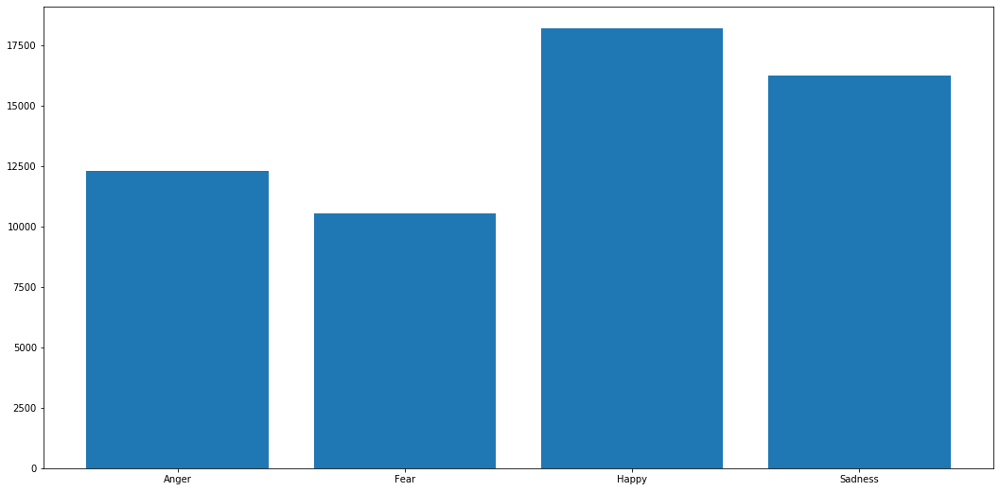

In [30]:
import matplotlib.pyplot as plt

plt.figure(figsize = (18,9))
#df.Class.value_counts().plot.bar()
to_plot=df.groupby('Class').count().reset_index()
plt.bar(to_plot['Class'],to_plot['Tweet'])
plt.show()

In [31]:
df.to_csv('C:/Users/Φιλωτας Θεοδοσιου/Desktop/df_before_preprocess1.csv')